In [63]:
def plot_image(xr_image, x="x", y="y", size=10):
    rgb = xr_image.to_array(dim="color")
    rgb = rgb.transpose(*(rgb.dims[1:] + rgb.dims[:1]))
    rgb = rgb / 255
    rgb.plot.imshow(x=x, y=y, size=size)

In [8]:
from datacube import Datacube
dc = Datacube()
data = dc.load(
    product='ls8_nbart_geomedian_annual',
    measurements=['red', 'green', 'blue'],
    latitude=(-16.1144, -13.4938),
    longitude=(140.7184, 145.6924),
    time=('2019-01', '2019-01'),
    output_crs="EPSG:3577",
    resolution=(-300,300)
)


/env/lib/python3.6/site-packages/datacube/drivers/postgres/_connections.py:87: SADeprecationWarning: Calling URL() directly is deprecated and will be disabled in a future release.  The public constructor for URL is now the URL.create() method.
  username=username, password=password,


In [9]:
rgb_cfg = {
    "components": {
        "red": {"red": 1.0},
        "green": {"green": 1.0},
        "blue": {"blue": 1.0},
    },
    "scale_range": (50, 3000),
}

In [17]:
from datacube_ows.styles.api import StandaloneStyle, apply_ows_style_cfg, xarray_image_as_png

xr_image = apply_ows_style_cfg(rgb_cfg, data)
png_image = xarray_image_as_png(xr_image)
with open("example1.png", "wb") as fp:
     fp.write(png_image)

In [18]:
from datacube import Datacube
dc = Datacube()
data = dc.load(
    product='ls8_nbart_geomedian_annual',
    measurements=['red', 'green', 'blue', 'nir', 'swir1','swir2'],
    latitude=(-16.1144, -13.4938),
    longitude=(140.7184, 145.6924),
    time=('2019-01', '2019-01'),
    output_crs="EPSG:3577",
    resolution=(-300,300)
)


/env/lib/python3.6/site-packages/datacube/drivers/postgres/_connections.py:87: SADeprecationWarning: Calling URL() directly is deprecated and will be disabled in a future release.  The public constructor for URL is now the URL.create() method.
  username=username, password=password,


In [19]:
ir_green_cfg = {
    "components": {
        "red": {
            "swir1": 1.0
        },
        "green": {
            "nir": 1.0
        },
        "blue": {
            "green": 1.0
        },
    },
    "scale_range": (50, 3000),
}

In [20]:
xr_image_irg = apply_ows_style_cfg(ir_green_cfg, data)

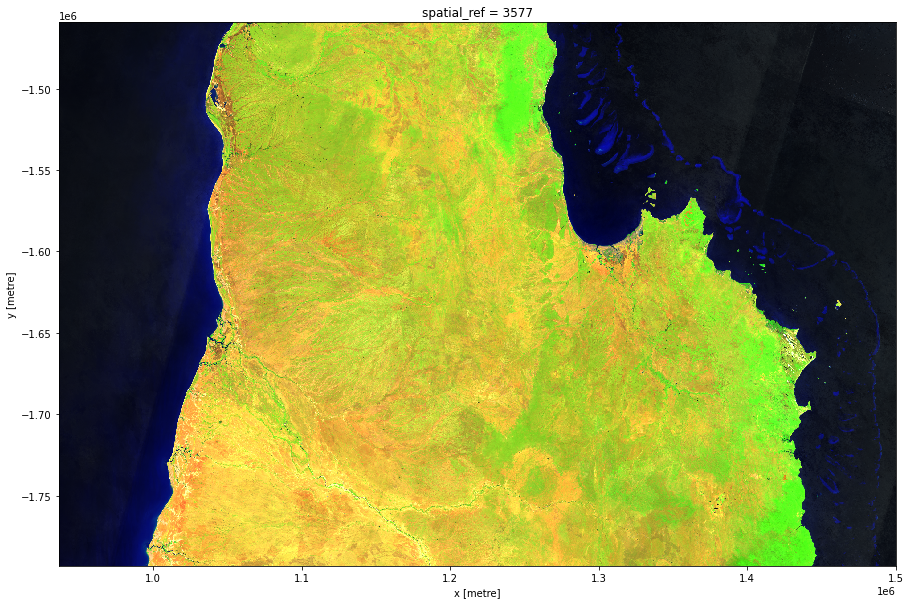

In [22]:
plot_image(xr_image_irg)

In [23]:
pure_red_cfg = {
    "components": {
        "red": {
         "red": 1.0
        },
        "green": {
         "red": 1.0
        },
        "blue": {
         "red": 1.0
        },
    },
    "scale_range": (50, 3000),
}

In [27]:
red_image = apply_ows_style_cfg(pure_red_cfg, data)

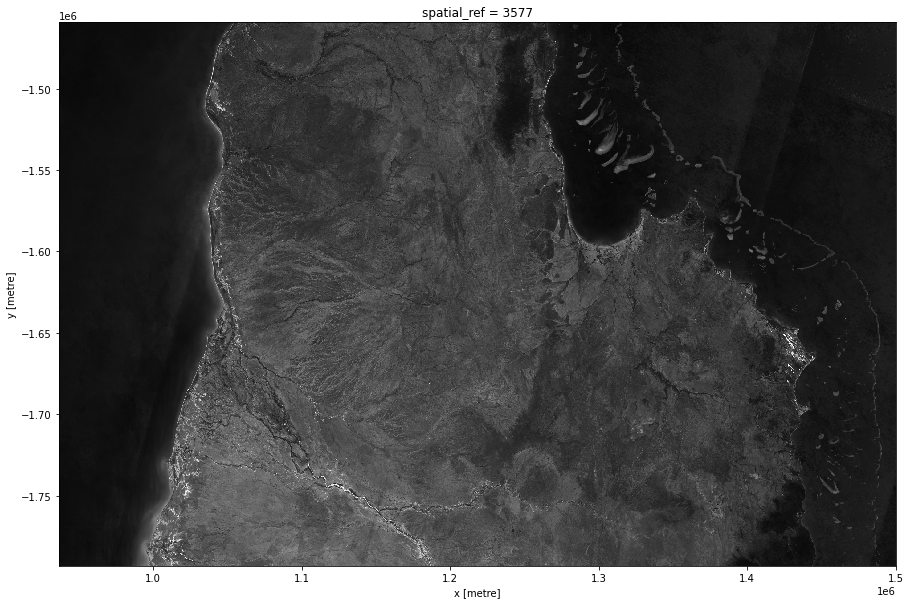

In [28]:
plot_image(red_image)

In [29]:
#when mixing bands, make sure the band totals add to 1
all_bands_cfg = {
    "components": {
        "red": {
         "red": 0.333,
         "green": 0.333,
         "blue": 0.333,
        },
        "green": {
         "nir": 1.0
        },
        "blue": {
         "swir1": 0.5,
         "swir2": 0.5,
        },
    },
    "scale_range": (50, 3000),
}

In [30]:
mix_image= apply_ows_style_cfg(all_bands_cfg, data)

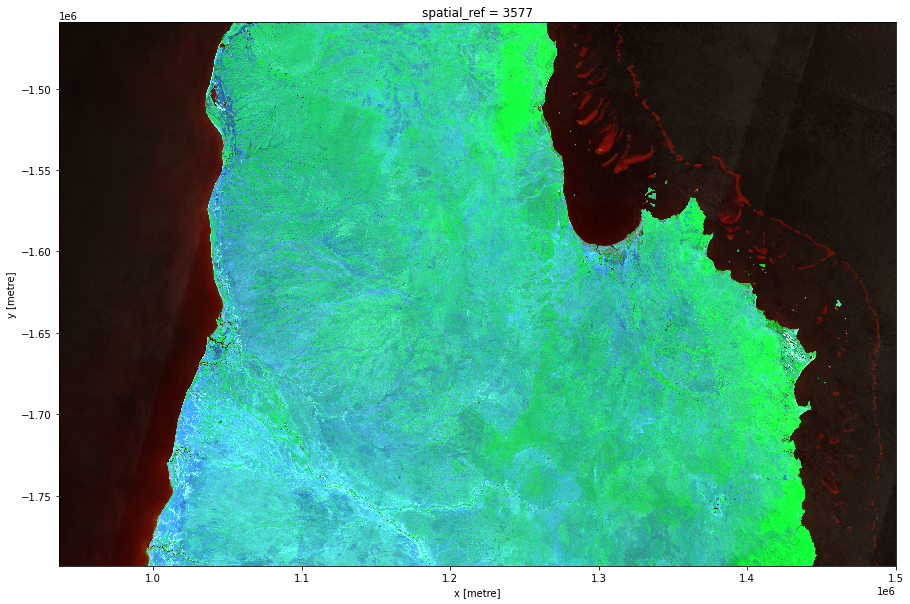

In [31]:
plot_image(mix_image)

### ok lets play with scaling

dark stuff is in 0-50 so we care less about that. We don't usually care about 3000-10000, because it's very bright stuff. eg. snowdrift ridges and cloud details.


This is based off a scale range of 0-10000

These numbers are based off the histograms of the data

Optimum scale ranges can vary across the full range of your data. E.g. desert is bright, Vic/Tas is dull.

In [54]:
irg_bandscale_cfg = {
    "components": {
        "red": {
            "swir1": 1.0,
            "swir2": 0.5, #these have to add to one. I keep stuffing this up
            "scale_range": (1500, 3700),
        },
        "green": {
            "nir": 7.0, #this is not supposed to be more than 1
            "scale_range": (1600, 3200),
        },
        "blue": {
            "green": 1.0
        },
    },
    "scale_range": (200, 1900),
}

#if you don't have a specific range it will default to the global scale range

In [52]:
irg_image = apply_ows_style_cfg(irg_bandscale_cfg, data)

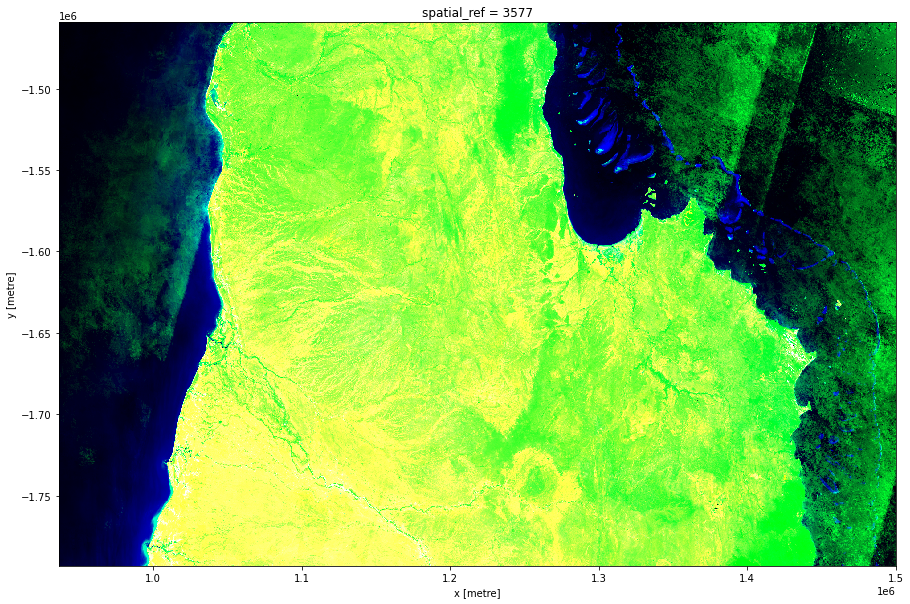

In [53]:
plot_image(irg_image)

Ok now we do rgb ndvi things

In [56]:
def ndvi(data):
    # Returns data in range (-1, 1)
    return (data["nir"] - data["red"]) / (data["nir"] + data["red"])

In [66]:
def ndvi(data):
    # Calculate NDVI (-1.0 to 1.0)
    unscaled = (data["nir"] - data["red"])/(data["nir"] + data["red"])

    # Scale to [-1.0 - 1.0] to [0 - 255]
    scaled = ((unscaled + 1.0) * 255/2).clip(0, 255)

    return scaled

r_ndvi_b_fullrange_cfg = {
    "components": {
        "red": {"red": 1.0},
        "green": ndvi,
        "blue": {"blue": 1.0},
    },
    "scale_range": (50, 3000),
}

In [59]:
ndvi_rgb_cfg = {
    "components": {
        "red": {"red": 1.0},
        "green": ndvi,
        "blue": {"blue": 1.0},
    },
    "scale_range": (50, 3000),
}

In [67]:
image=apply_ows_style_cfg(r_ndvi_b_fullrange_cfg, data)

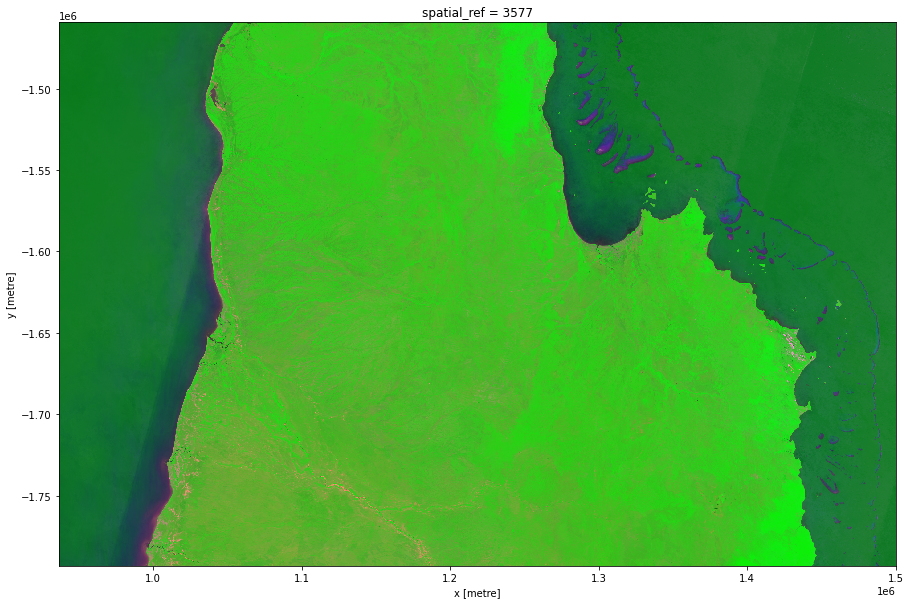

In [68]:
plot_image(image)

YOU CAN USE A DECORATOR

In [71]:
from datacube_ows.styles.api import scalable
@scalable
def scaled_ndvi(data):
    # Calculate NDVI (-1.0 to 1.0)
    return (data["nir"] - data["red"])/(data["nir"] + data["red"])


you can pass a function to the config

In [77]:
r2_ndvi_b_fullrange_cfg = {
    "components": {
        "red": {"red": 1.0},
        "green": {"function": scaled_ndvi,
                  "kwargs": {"scale_from":(0.0, 1.0),
                            "scale_to":(0,255)
                }
                 },
        "blue": {"blue": 1.0},
    },
    "scale_range": (50, 3000),
}

In [78]:
image=apply_ows_style_cfg(r2_ndvi_b_fullrange_cfg, data)

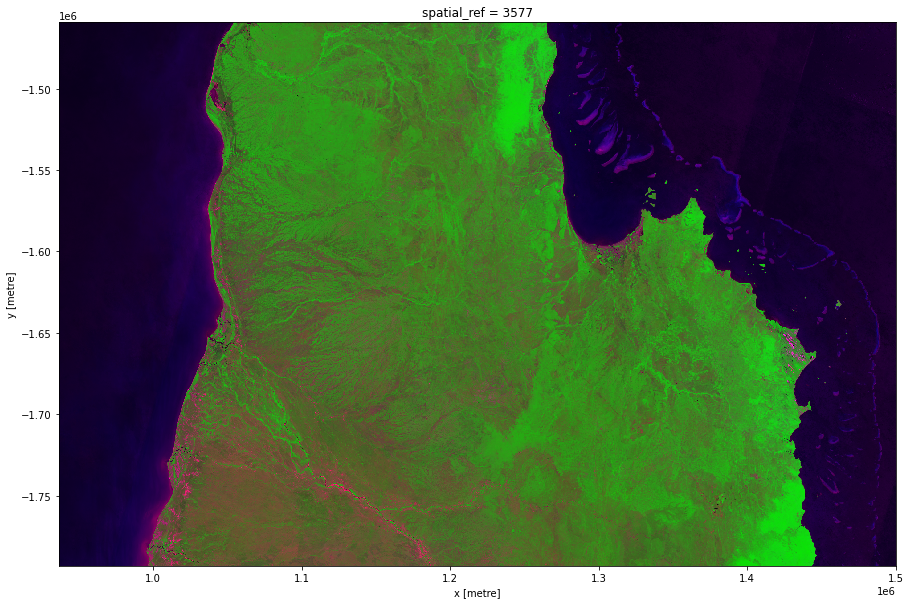

In [79]:
plot_image(image)

In [84]:
r_ndvi_ndwi_halfrange_cfg = {
    "components": {
        "red": {"red": 1.0},
        "green": {
            "function": "datacube_ows.band_utils.norm_diff",
            "kwargs": {
                "band1": "nir",
                "band2": "red",
                "scale_from": (0.0, 1.0),
                "scale_to": (0, 255)
            }
        },
        "blue": {
            "function": "datacube_ows.band_utils.norm_diff",
            "kwargs": {
                "band1": "green",
                "band2": "nir",
                "scale_from": (0.0, 1.0),
                "scale_to": (0, 255)
            }
        },
    },
    "scale_range": (50, 3000),
}

### Note: if you have a function, this turns off the scale range FOR that BAND

In [85]:
image=apply_ows_style_cfg(r_ndvi_ndwi_halfrange_cfg, data)

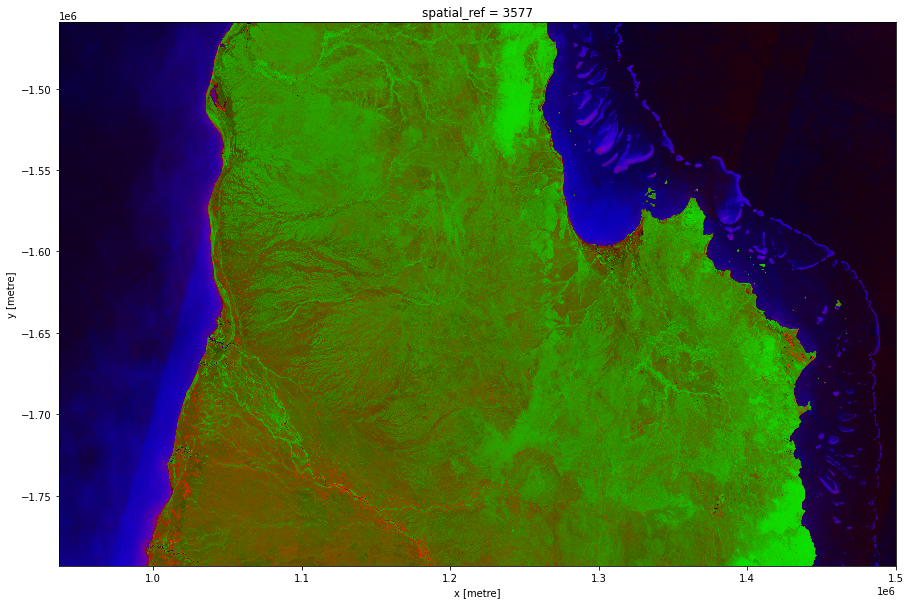

In [86]:
plot_image(image)

# now we work on Matplotlib colormaps

In [88]:
ndvi_bidirection_cfg = {
    "index_function": {
        "function": "datacube_ows.band_utils.norm_diff",
        "mapped_bands": True,
        "kwargs": {"band1": "nir", "band2": "red"},
    },
    "mpl_ramp": "RdYlGn",
    "range": [-1.0, 1.0]
}

In [89]:
image=apply_ows_style_cfg(ndvi_bidirection_cfg, data)

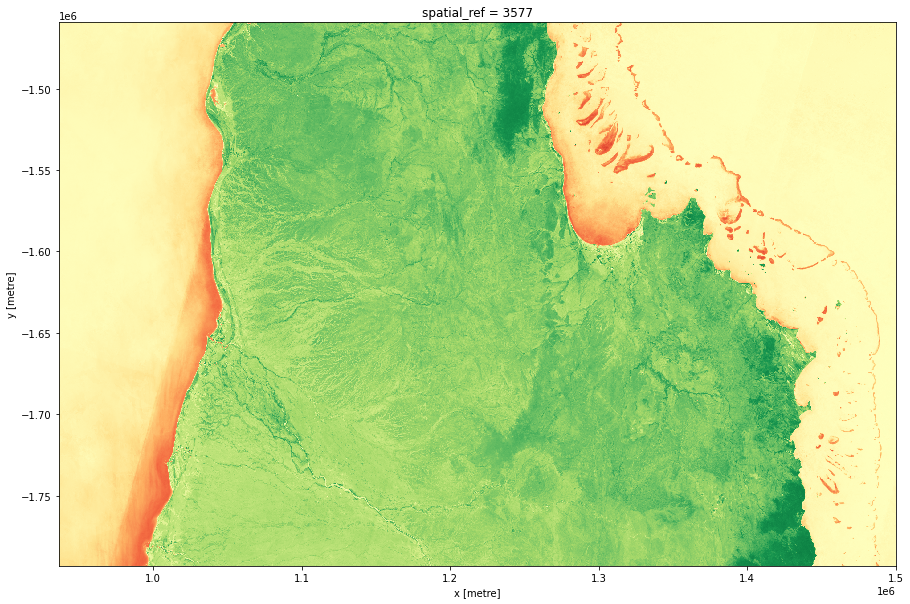

In [90]:
plot_image(image)

In [91]:
ndvi_unidirection_cfg = {
    "index_function": {
        "function": "datacube_ows.band_utils.norm_diff",
        "mapped_bands": True,
        "kwargs": {"band1": "nir", "band2": "red"},
    },
    "mpl_ramp": "ocean_r",
    "range": [0.0, 1.0]
}

In [92]:
image=apply_ows_style_cfg(ndvi_unidirection_cfg, data)

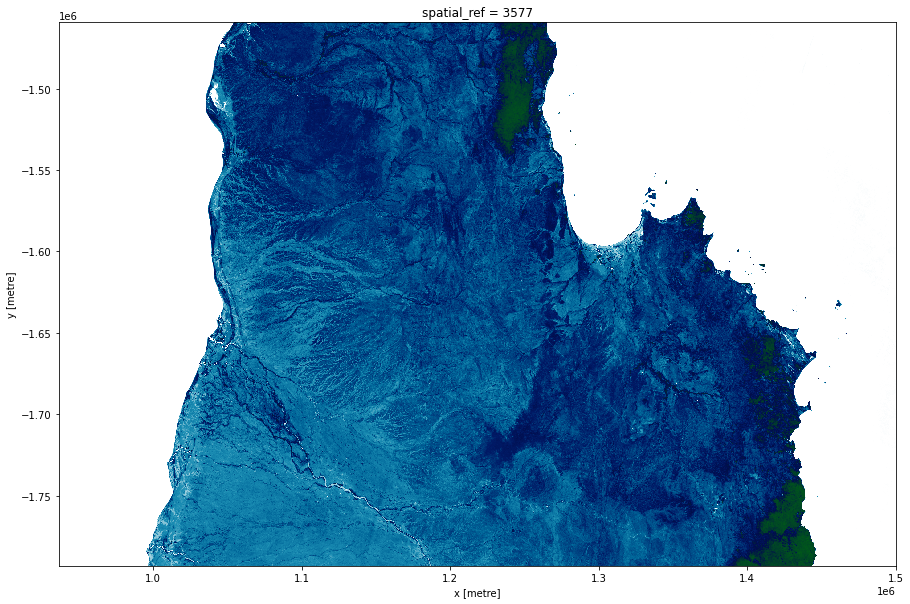

In [93]:
plot_image(image)

In [94]:
ndvi_custom_ramp_cfg = {
    "index_function": {
        "function": "datacube_ows.band_utils.norm_diff",
        "kwargs": {"band1": "nir", "band2": "red"},
    },
    "color_ramp": [
        {"value": -1.0, "color": "#0000FF"},
        {"value": -0.2, "color": "#005050",},
        {"value": -0.1, "color": "#505050",},
        {"value": -0.01, "color": "#303030",},
        {"value": 0.0, "color": "black",},
        {"value": 0.01, "color": "#303000",},
        {"value": 0.5, "color": "#707030",},
        {"value": 1.0, "color": "#FF9090",},
    ]
}

In [95]:
image=apply_ows_style_cfg(ndvi_custom_ramp_cfg, data)

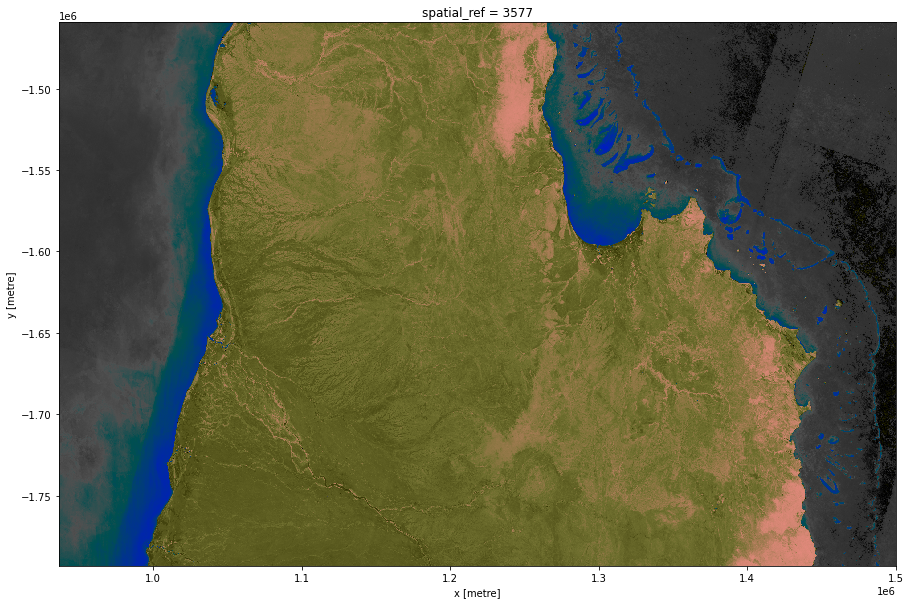

In [96]:
plot_image(image)

xkcd doesn't seem to work

In [103]:
# ndvi_custom_ramp_xkcd_cfg = {
#     "index_function": {
#         "function": "datacube_ows.band_utils.norm_diff",
#         "kwargs": {"band1": "nir", "band2": "red"},
#     },
#     "color_ramp": [
#         {"value": -1.0, "color": 'bland'},
#         {"value": -0.2, "color": "#005050",},
#         {"value": -0.1, "color": "#505050",},
#         {"value": -0.01, "color": "#303030",},
#         {"value": 0.0, "color": "black",},
#         {"value": 0.01, "color": "#303000",},
#         {"value": 0.5, "color": "#707030",},
#         {"value": 1.0, "color": "#FF9090",},
#     ]
# }

Custom color ramp with alpha. 0 = transparent, 255/1 = fully opaque

In [110]:
ndvi_custom_ramp_alpha_cfg = {
    "index_function": {
        "function": "datacube_ows.band_utils.norm_diff",
        "kwargs": {"band1": "nir", "band2": "red"},
    },
    "color_ramp": [
        # For NDVI -1.0 to 0.0, the image is fully transparent.

        {
            "value": -1.0,
            "color": "#000000",
            "alpha": 0.0,
        },
        {
            "value": 0.0,
            "color": "#000000",
            "alpha": 0.0,
        },

        # For NDVI 0.0 to 0.1, the transparency gradually reduces to zero and colour
        # fades from black to dark blue.

        {
            "value": 0.1,
            "color": "#000030",
            "alpha": 1.0,
        },

        # For NDVI 0.1 to 0.3 colour brightens from dark blue to a dark purple

        {
            "value": 0.3,
            "color": "#703070",
        },

        # For NDVI 0.3 to 0.6 colour brightens from purple to yellow.

        {
            "value": 0.6,
            "color": "#e0e070",
        },

        # For NDVI 0.6 to 1.0 colour brightens from yellow to bright green.

        {
            "value": 1.0,
            "color": "#90FF90",
        }
    ]
}

In [111]:
image=apply_ows_style_cfg(ndvi_custom_ramp_alpha_cfg, data)

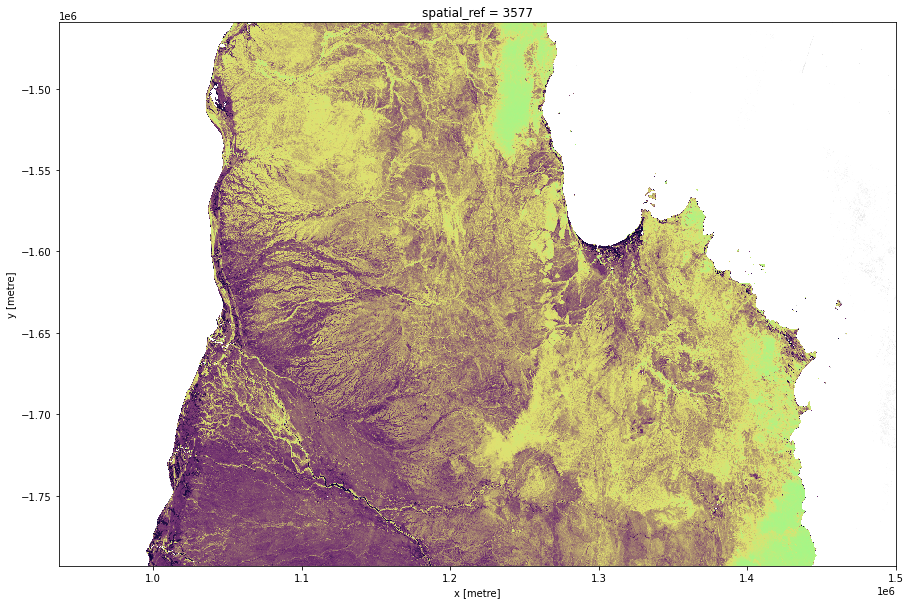

In [112]:
plot_image(image)

In [ ]:
"legend": {
    # Legend title will be display as "This is a nice legend"
    "title": "This is a nice legend"
}

In [ ]:
plot_image(image)

band math in the color ramp config

In [115]:
ndvi_custom_ramp_cfg = {"index_expression":"(nir-red)/(nir+red)",
        "color_ramp": [
        {"value": -1.0, "color": "#0000FF"},
        {"value": -0.2, "color": "#005050",},
        {"value": -0.1, "color": "#505050",},
        {"value": -0.01, "color": "#303030",},
        {"value": 0.0, "color": "black",},
        {"value": 0.01, "color": "#303000",},
        {"value": 0.5, "color": "#707030",},
        {"value": 1.0, "color": "#FF9090",},
    ]
}

In [116]:
image=apply_ows_style_cfg(ndvi_custom_ramp_cfg, data)

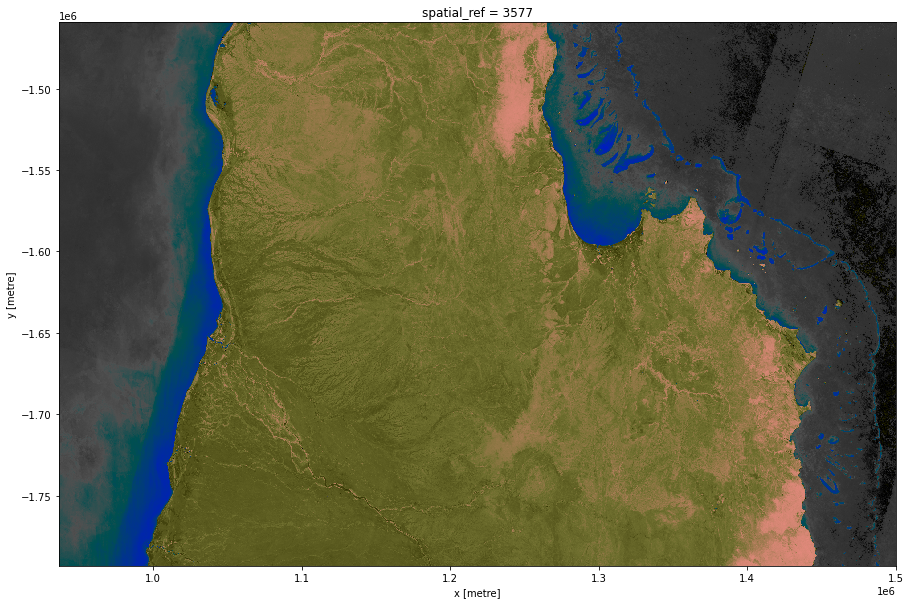

In [117]:
plot_image(image)

now we do color maps instead of color ramps, eg. discrete data

In [119]:
from datacube import Datacube
dc = Datacube()

disc_data = dc.load(
    product='ga_ls_wo_3',
    measurements=['water'],
    latitude=(-15.9098, -15.0496),
    longitude=(128.0882, 129.2171),
    time=('2020-12-24T10:00:00', '2020-12-25T09:59:59'),
    output_crs="EPSG:3577",
    resolution=(-120,120),
    group_by="solar_day"
)

/env/lib/python3.6/site-packages/datacube/drivers/postgres/_connections.py:87: SADeprecationWarning: Calling URL() directly is deprecated and will be disabled in a future release.  The public constructor for URL is now the URL.create() method.
  username=username, password=password,


In [125]:
disc_data["water"].attrs

{'units': '1',
 'nodata': 1,
 'flags_definition': {'dry': {'bits': [7, 6, 5, 4, 3, 2, 1, 0],
   'values': {'0': True},
   'description': 'No water detected'},
  'wet': {'bits': [7, 6, 5, 4, 3, 2, 1, 0],
   'values': {'128': True},
   'description': 'Clear and Wet'},
  'cloud': {'bits': 6,
   'values': {'0': False, '1': True},
   'description': 'Cloudy'},
  'nodata': {'bits': 0,
   'values': {'0': False, '1': True},
   'description': 'No data'},
  'high_slope': {'bits': 4,
   'values': {'0': False, '1': True},
   'description': 'High slope'},
  'cloud_shadow': {'bits': 5,
   'values': {'0': False, '1': True},
   'description': 'Cloud shadow'},
  'noncontiguous': {'bits': 1,
   'values': {'0': False, '1': True},
   'description': 'At least one EO band is missing or saturated'},
  'terrain_shadow': {'bits': 3,
   'values': {'0': False, '1': True},
   'description': 'Terrain shadow'},
  'low_solar_angle': {'bits': 2,
   'values': {'0': False, '1': True},
   'description': 'Low solar incide

In [135]:
simple_map_cfg = {
    "value_map": {
        # Value_map maps a band to a list of rules.
        # Do not put multiple bands with independent rules into a single value_map. It
        # may appear to work, but in practice you cannot guarantee which band will be checked
        # for matches first, and therefore the output may render inconsistently from one python
        # instance to another.
        "water": [
            {
                "title": "Water",
                "abstract": "",
                "flags": {"wet": True},
                "color": "Aqua",
            },
            {
                "title": "cloud",
                "abstract": "",
                "flags": {"cloud": True},
                "color": "Beige",
            },
            {
                "title": "Terrain shadow",
                "abstract": "",
                # Flag rules can contain an "or" - they match if either of the conditions hold.
                "flags": {"or": {"terrain_shadow": True, "high_slope": True}},
                "color": "SlateGray",
            },
            {
                "title": "Cloud Shadow",
                "abstract": "",
                # Flag rules can contain an "and" - they match if all of the conditions hold.
                "flags": {"cloud_shadow": True},#, "high_slope": True}},
                "color": "DarkKhaki",
            },
            {
                "title": "Dry",
                "abstract": "",
                "flags": {"dry": True},
                "color": "Brown",
            },
        ]
    }
}

### be aware rules are evaluated in order, which means that if something is in both you have problems

In [136]:
image=apply_ows_style_cfg(simple_map_cfg, disc_data)

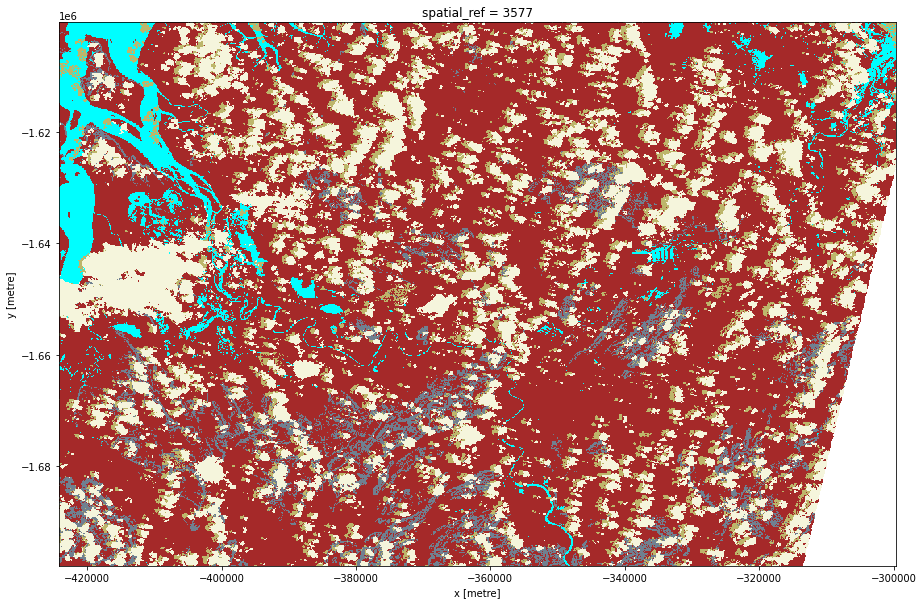

In [137]:
plot_image(image)

In [ ]:
simple_map_cfg = {
    "value_map": {
        # Value_map maps a band to a list of rules.
        # Do not put multiple bands with independent rules into a single value_map. It
        # may appear to work, but in practice you cannot guarantee which band will be checked
        # for matches first, and therefore the output may render inconsistently from one python
        # instance to another.
        "water": [
            {
                "title": "Water",
                "abstract": "",
                "flags": {"wet": True},
                "color": "Aqua",
            },
            {
                "title": "cloud",
                "abstract": "",
                "flags": {"cloud": True},
                "color": "Beige",
            },
            {
                "title": "Terrain shadow",
                "abstract": "",
                # Flag rules can contain an "or" - they match if either of the conditions hold.
                "flags": {"or": {"terrain_shadow": True, "high_slope": True}},
                "color": "SlateGray",
            },
            {
                "title": "Cloud Shadow",
                "abstract": "",
                # Flag rules can contain an "and" - they match if all of the conditions hold.
                "flags": {"cloud_shadow": True},#, "high_slope": True}},
                "color": "DarkKhaki",
            },
            {
                "title": "Dry",
                "abstract": "",
                "flags": {"dry": True},
                "color": "Brown",
            },
        ]
    }
}

In [139]:
transparency_map_config = {
    "value_map": {
        "water": [
            {
                # Make noncontiguous and invalid data transparent
                "title": "",
                "abstract": "",
                "flags": {
                    "or": {
                        "noncontiguous": True,
                        "nodata": True,
                },
                "alpha": 0.0,
                "color": "#ffffff",
            },
            {
                "title": "Cloudy Steep Terrain",
                "abstract": "",
                "flags": {
                    "and": {
                        "high_slope": True,
                        "cloud": True
                    }
                },
                "color": "#f2dcb4",
            }
            {
                "title": "Cloudy Water",
                "abstract": "",
                "flags": {
                    "and": {
                        "wet": True,
                        "cloud": True
                    }
                },
                "color": "#bad4f2",
            },
            {
                "title": "Shaded Water",
                "abstract": "",
                "flags": {
                    "and": {
                        "wet": True,
                        "cloud_shadow": True
                    }
                },
                "color": "#335277",
            },
            {
                "title": "Cloud",
                "abstract": "",
                "flags": {"cloud": True},
                "color": "#c2c1c0",
            },
            {
                "title": "Cloud Shadow",
                "abstract": "",
                "flags": {"cloud_shadow": True},
                "color": "#4b4b37",
            },
            {
                "title": "Terrain Shadow or Low Sun Angle",
                "abstract": "",
                flags": {
                    "or": {
                        "terrain_shadow": True,
                        "low_solar_angle": True
                    },
                },
                "color": "#2f2922",
            },
            {
                "title": "Steep Terrain",
                "abstract": "",
                "flags": {"high_slope": True},
                "color": "#776857",
            },
            {
                "title": "Water",
                "abstract": "",
                "flags": {
                    "wet": True,
                },
                "color": "#4f81bd",
            },
            {
                "title": "Dry",
                "abstract": "",
                "flags": {"wet": False},
                "color": "#96966e",
            },
        ]
    },
}

SyntaxError: invalid syntax (<ipython-input-139-30d0d47ce147>, line 27)